In [1]:
import matplotlib.pyplot as plt
import numpy as np

In [2]:
import mne

vhdr_file = 'N=20/subj01/tactile imagery/NeoRec_2021-05-17_14-27-54.vhdr'

# Загрузка данных
raw = mne.io.read_raw_brainvision(vhdr_file, preload=True)


Extracting parameters from N=20/subj01/tactile imagery/NeoRec_2021-05-17_14-27-54.vhdr...
Setting channel info structure...
Reading 0 ... 168255  =      0.000 ...   336.510 secs...


In [4]:
def process_raw(raw):
    raw_ = raw.copy()
    raw_.filter(5, None, fir_design='firwin')  # High-pass filter at 5 Hz
    raw_.notch_filter(50)

    picks = mne.pick_types(raw_.info, eeg=True, exclude='bads')

    epochs = mne.make_fixed_length_epochs(raw_, duration=0.3, overlap=0.0)

    epochs.set_montage("standard_1020")

    ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter=800)
    ica.fit(epochs)

    muscle_idx_auto, scores = ica.find_bads_muscle(epochs)
    # ica.plot_scores(scores, exclude=muscle_idx_auto)

    ica.exclude = muscle_idx_auto
    # ica.plot_properties(epochs, picks=ica.exclude)
    orig_raw = epochs.copy()
    epochs.load_data()
    ica.apply(epochs)
    return raw_, epochs

Using matplotlib as 2D backend.


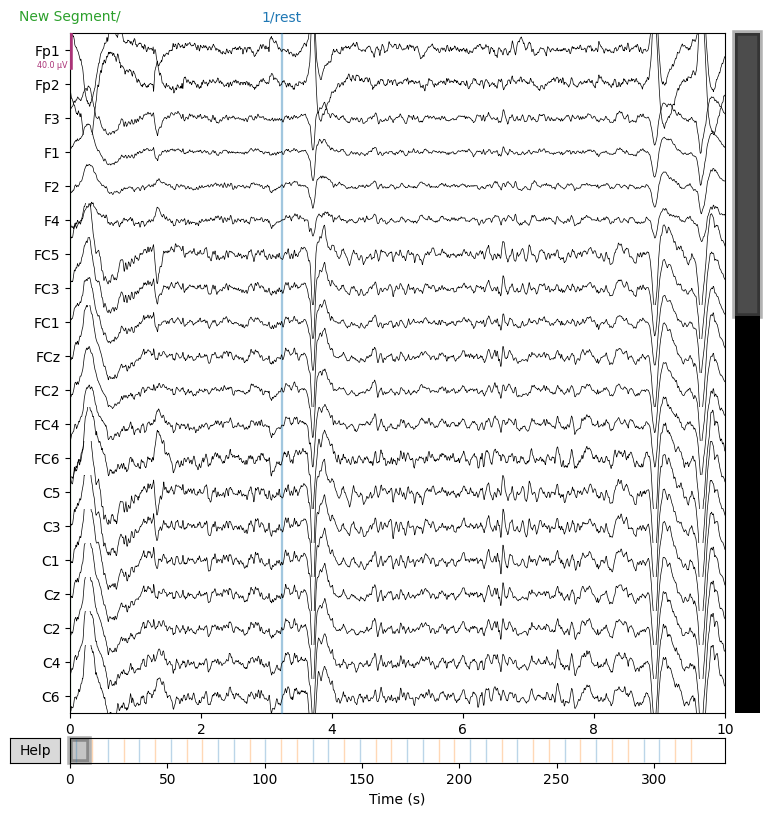

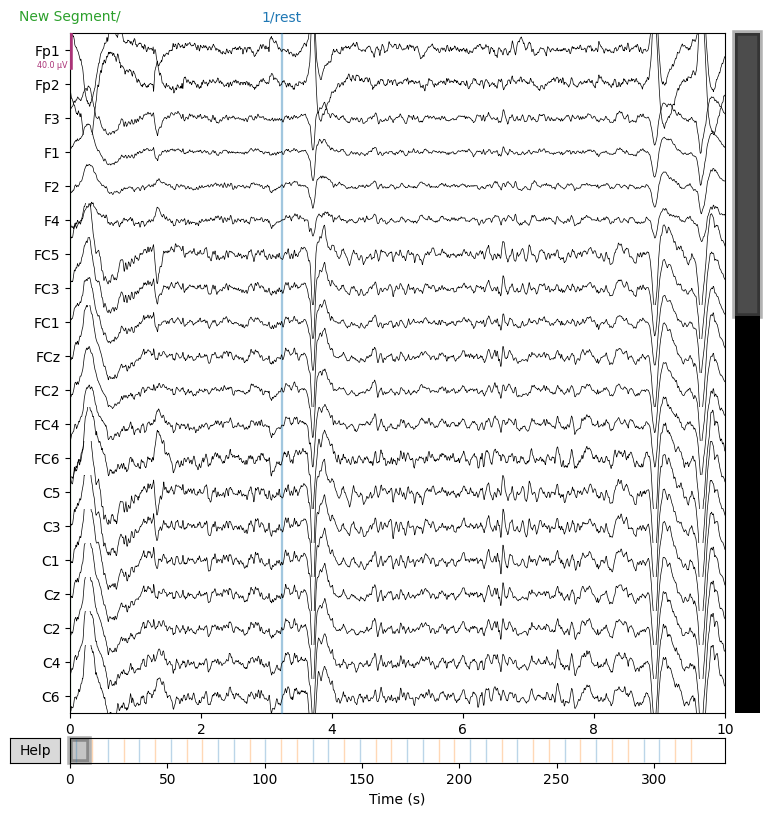

In [5]:
raw.plot()


In [6]:
raw.annotations

<Annotations | 41 segments: 1/rest (19), 3/ts (21), New Segment/ (1)>

In [7]:
# Фильтрация данных
raw.filter(5, None, fir_design='firwin')  # High-pass filter at 5 Hz
raw.notch_filter(50)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


<RawBrainVision | NeoRec_2021-05-17_14-27-54.eeg, 48 x 168256 (336.5 s), ~61.7 MiB, data loaded>

In [350]:
epochs = mne.make_fixed_length_epochs(raw, duration=0.3, overlap=0.0)

Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated


Using data from preloaded Raw for 673 events and 250 original time points ...
0 bad epochs dropped


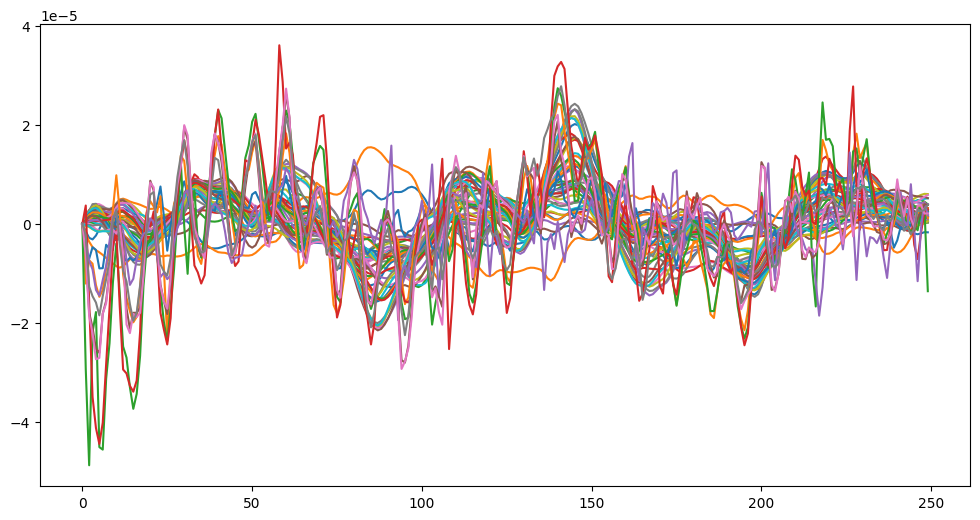

In [331]:
plt.figure(figsize=(12,6))
plt.plot(epochs.get_data()[0].T)
plt.show()

Using data from preloaded Raw for 20 events and 50 original time points ...


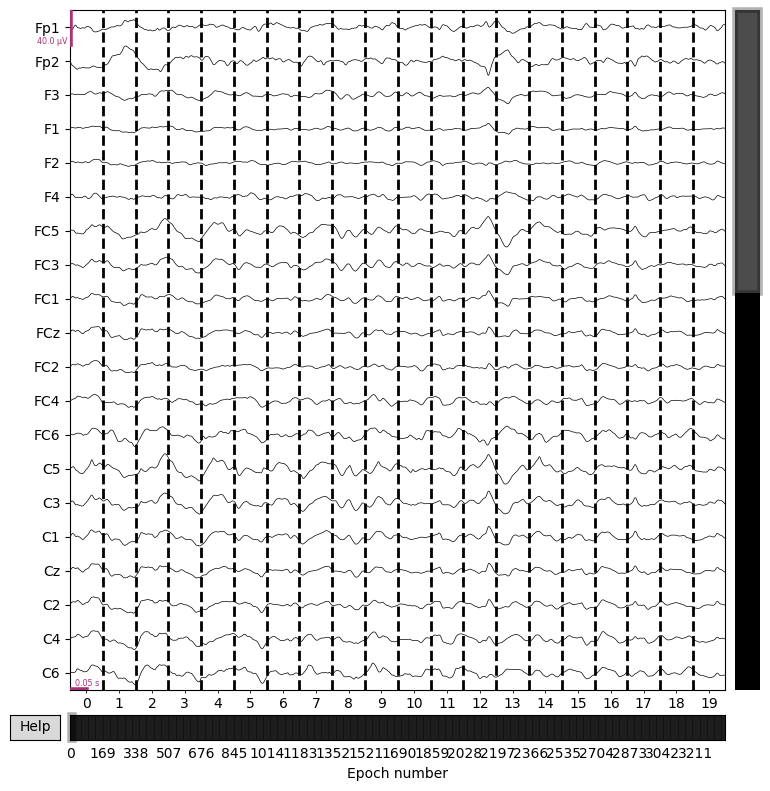

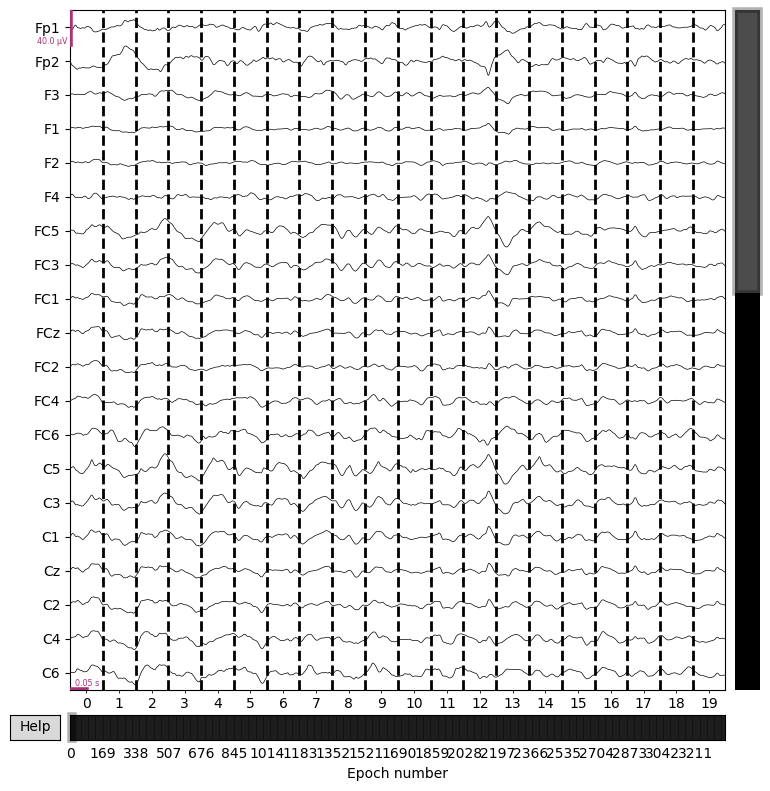

In [309]:
epochs.plot()


NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Using data from preloaded Raw for 3365 events and 50 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


/var/folders/j5/w7wcgztd3yx3t5qry7kcv9480000gn/T/ipykernel_50881/1235298939.py:1: RuntimeWarning: Channel locations not available. Disabling spatial colors.
  epochs.plot_psd()
/opt/homebrew/lib/python3.11/site-packages/mne/viz/utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


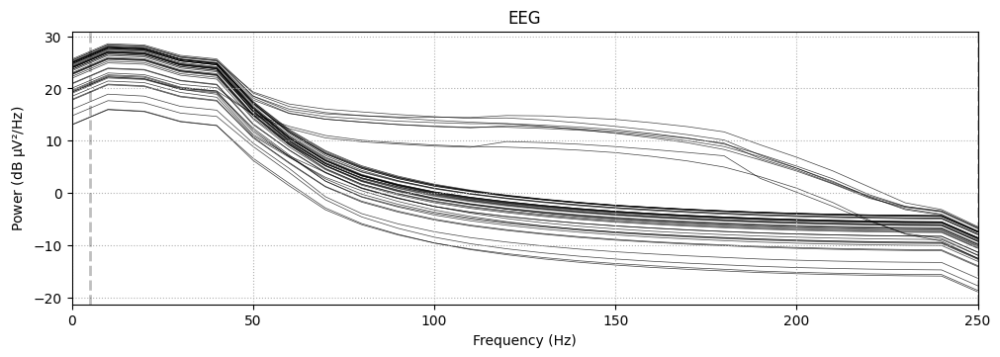

In [310]:
epochs.plot_psd()


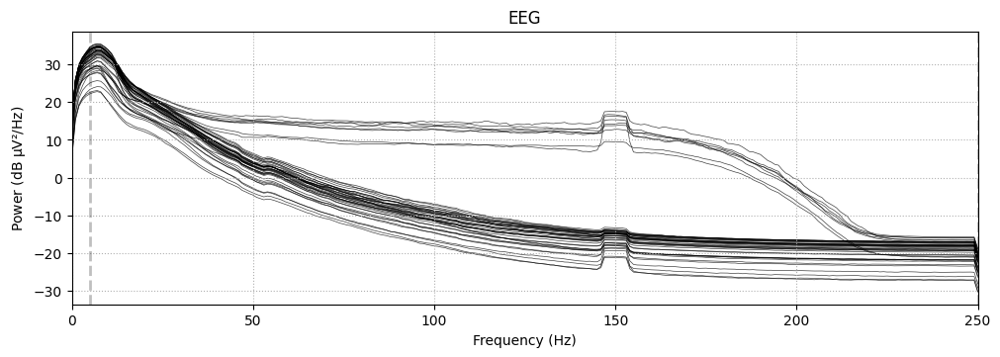

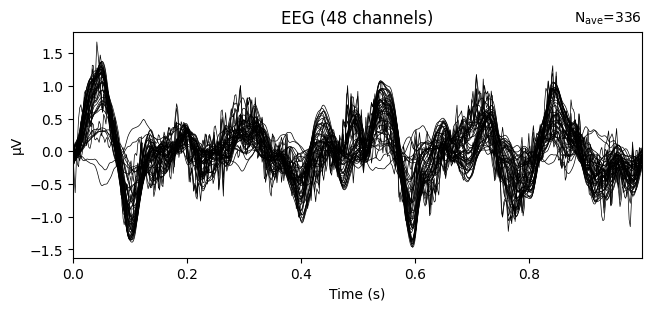

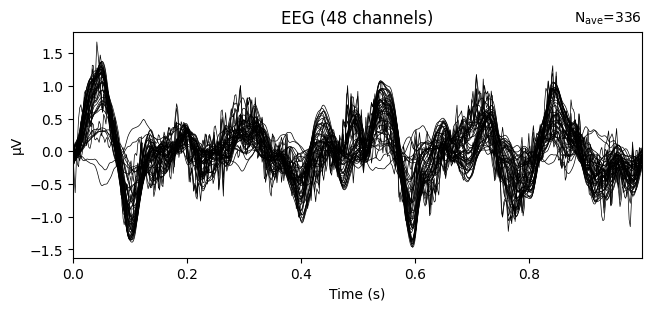

In [125]:
epochs.average().plot()

In [351]:
# Выбор каналов ЭЭГ 
picks = mne.pick_types(raw.info, eeg=True, exclude='bads')


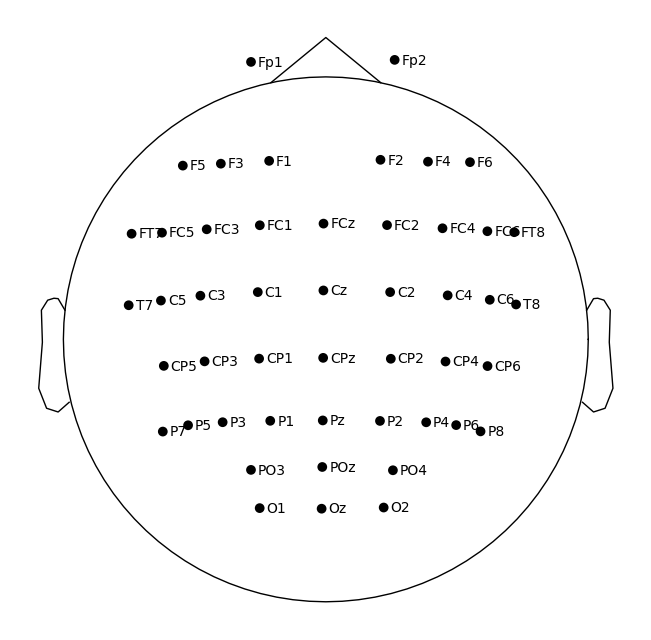

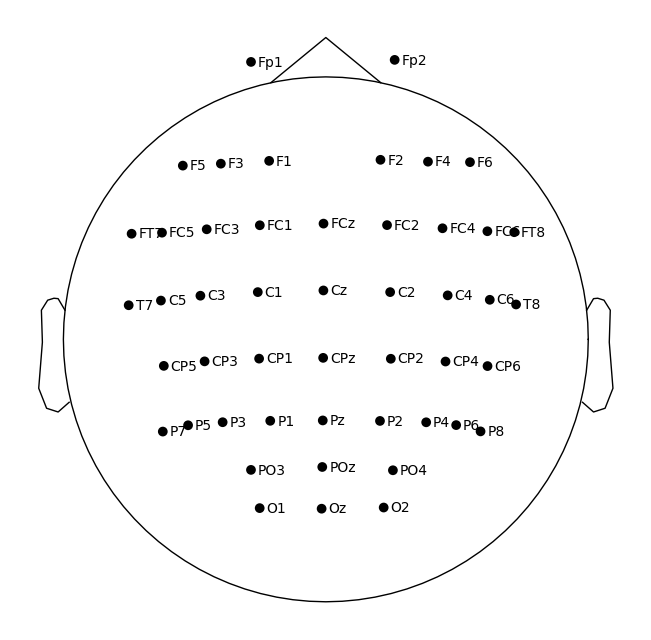

In [352]:
epochs.set_montage("standard_1020")

epochs.plot_sensors(show_names=True)


Fitting ICA to data using 48 channels (please be patient, this may take a while)
Using data from preloaded Raw for 1121 events and 150 original time points ...
0 bad epochs dropped
Selecting by number: 20 components
Using data from preloaded Raw for 1121 events and 150 original time points ...
Fitting ICA took 10.6s.
Using data from preloaded Raw for 1121 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated


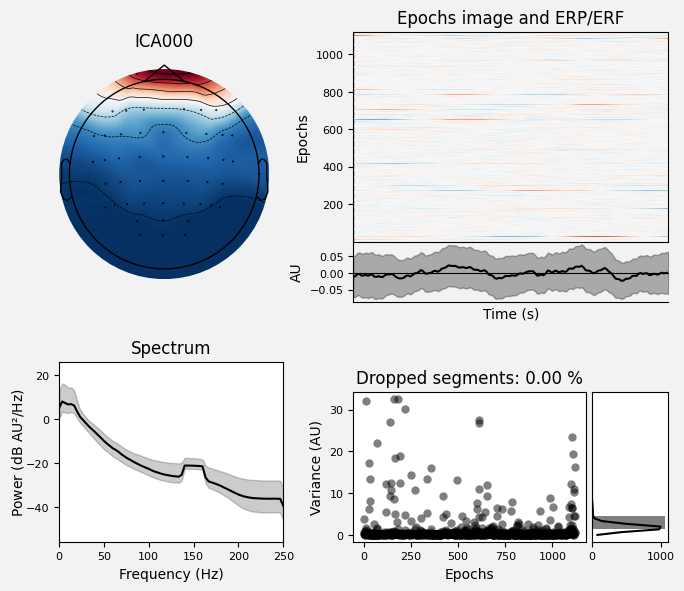

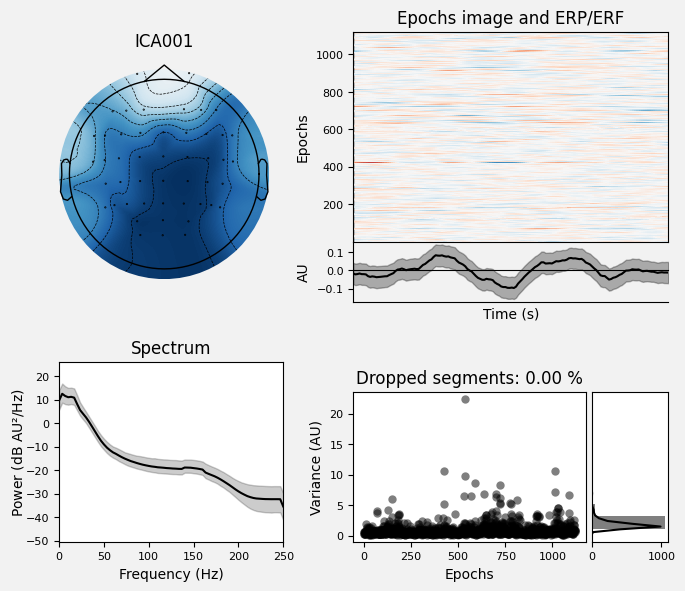

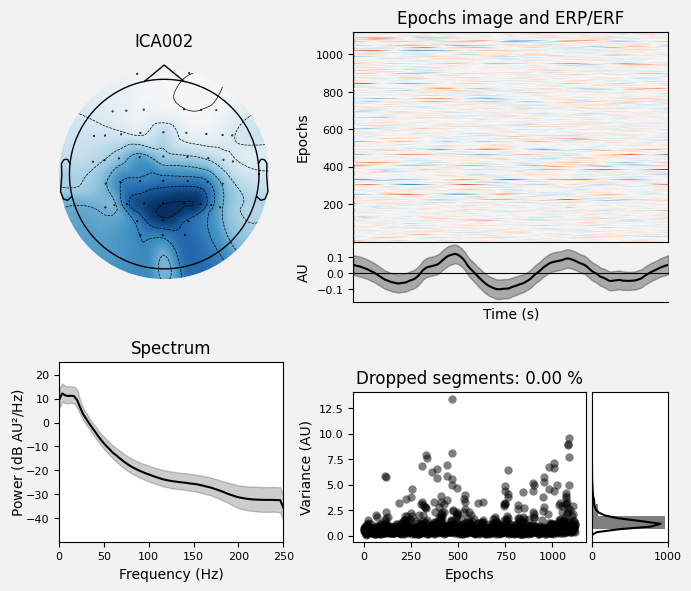

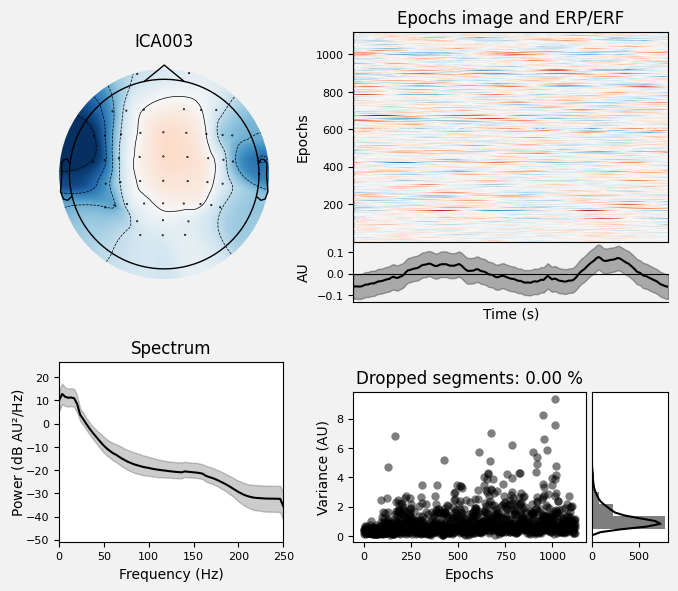

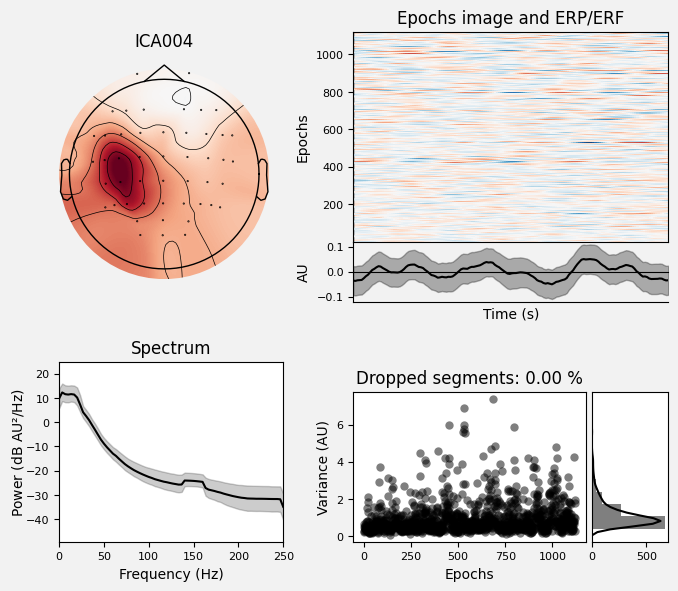

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [353]:
ica = mne.preprocessing.ICA(n_components=20, random_state=97, max_iter=800)
ica.fit(epochs)
ica.plot_properties(epochs)

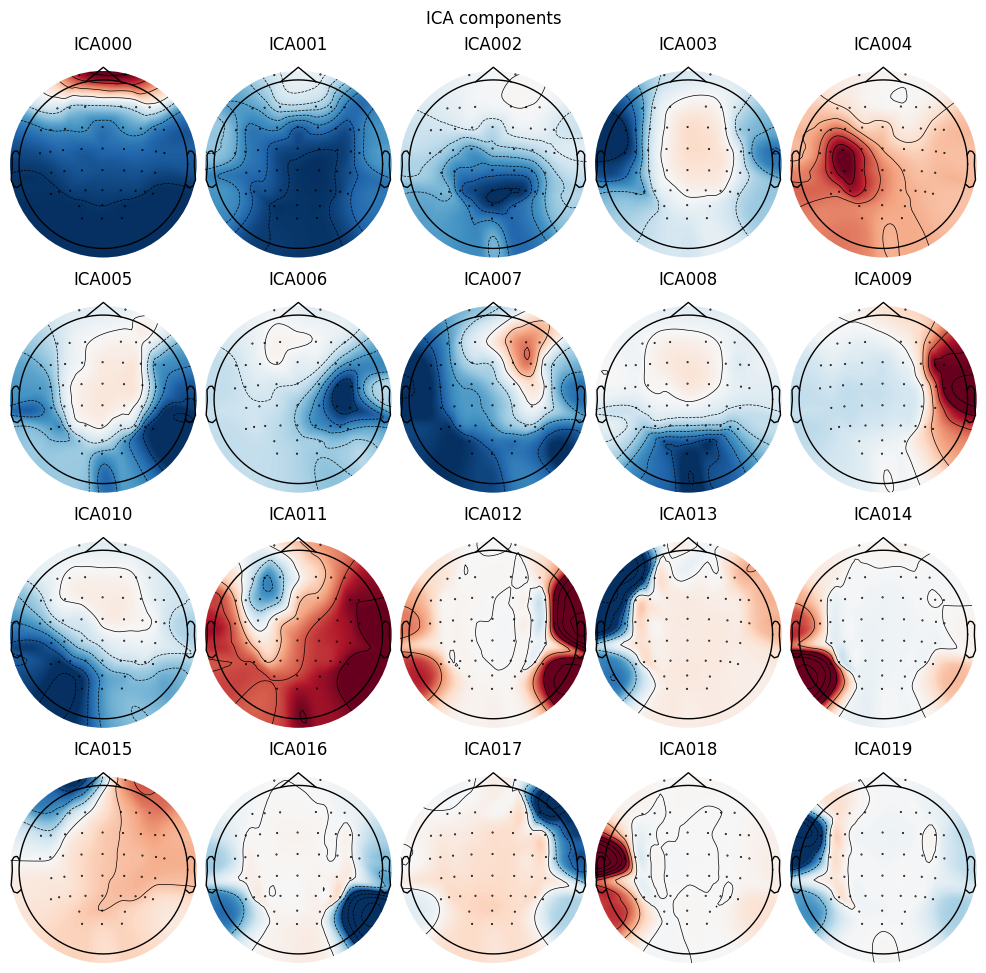

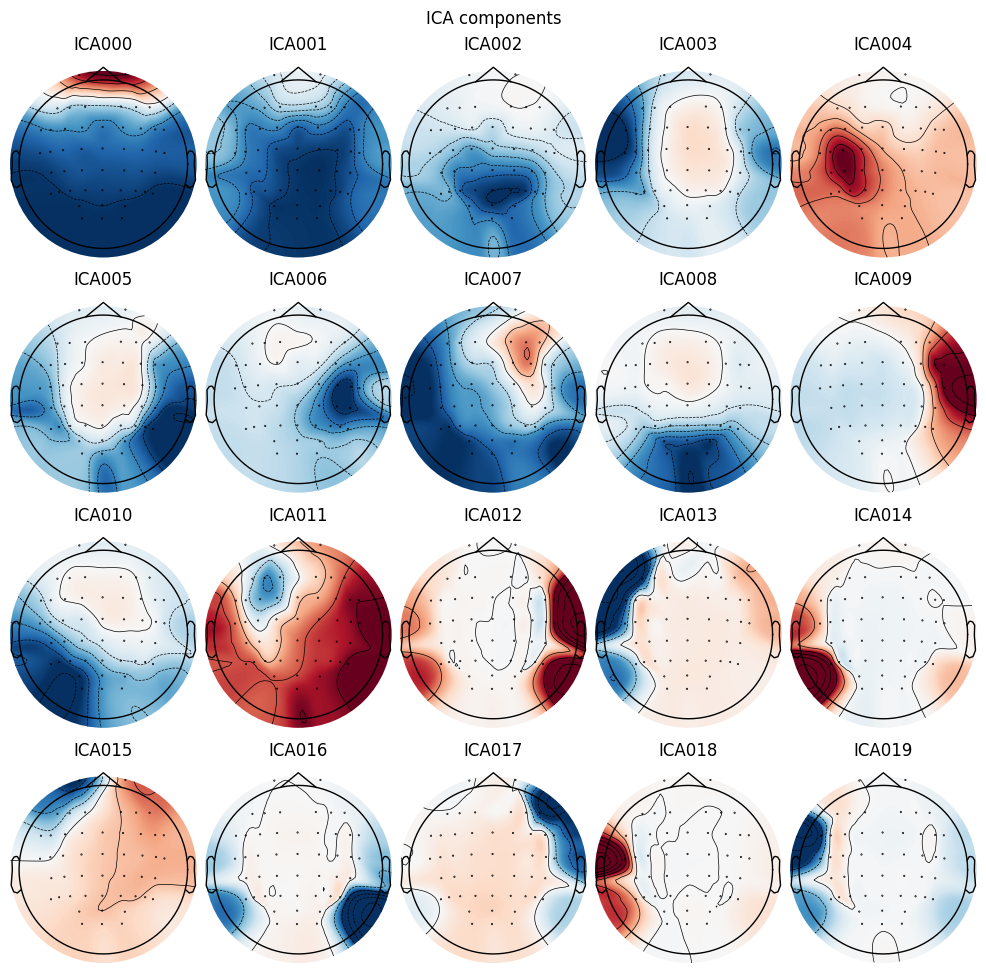

In [354]:
ica.plot_components(inst=epochs, picks=range(20))

Using data from preloaded Raw for 1121 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows


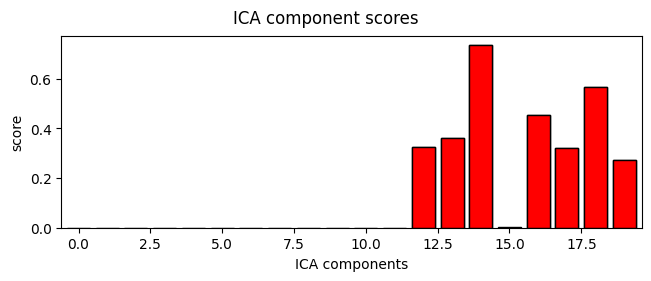

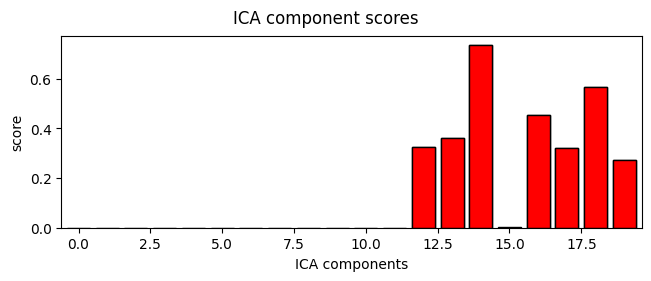

In [355]:
# https://mne.tools/stable/auto_examples/preprocessing/muscle_ica.html#footcite-dharmapranietal2016
muscle_idx_auto, scores = ica.find_bads_muscle(epochs)
ica.plot_scores(scores, exclude=muscle_idx_auto)

Using data from preloaded Raw for 1121 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1121 matching events found
No baseline correction applied
0 projection items activated


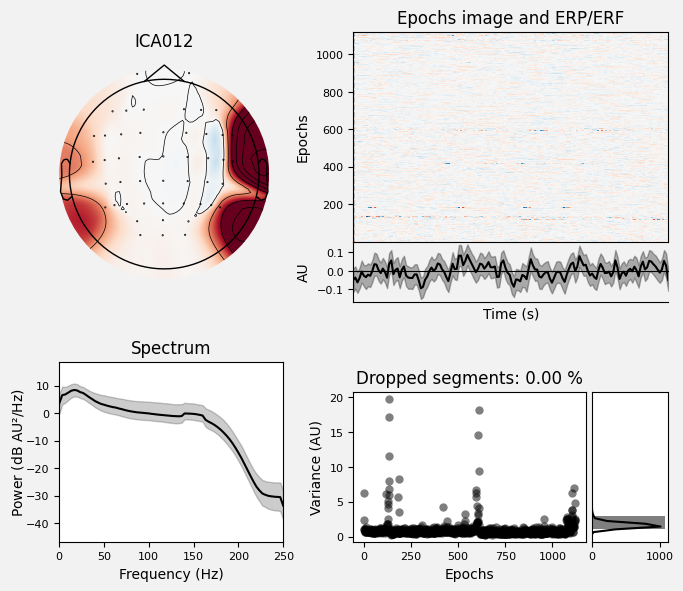

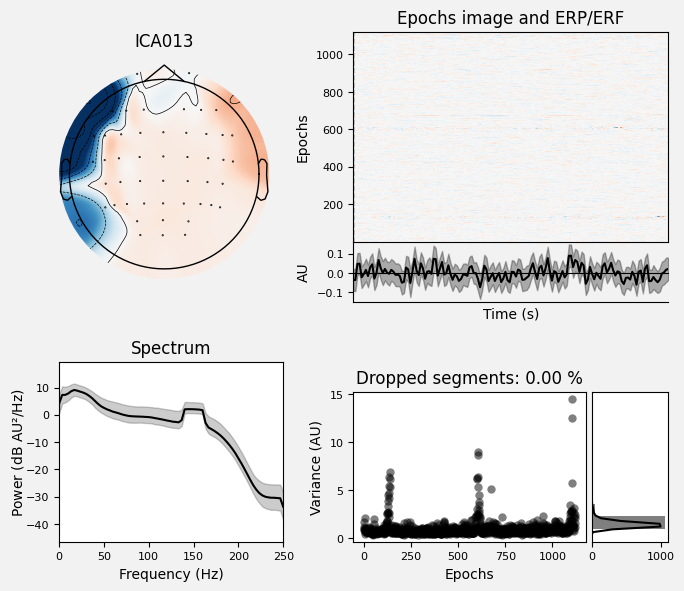

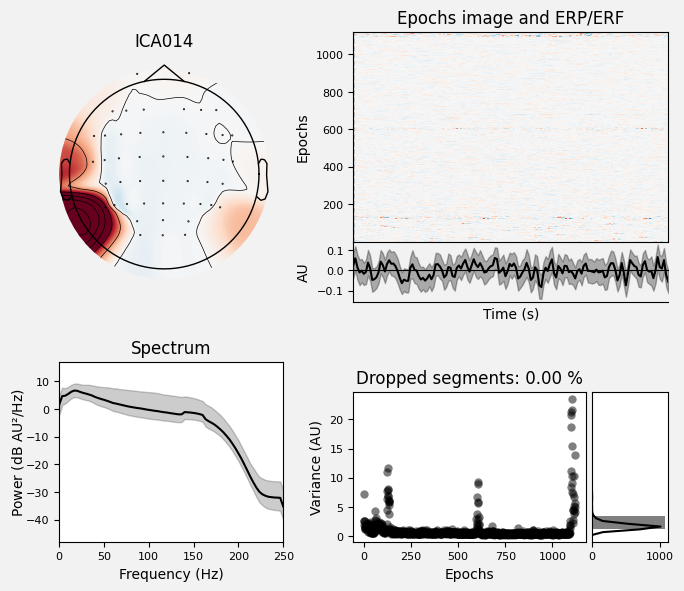

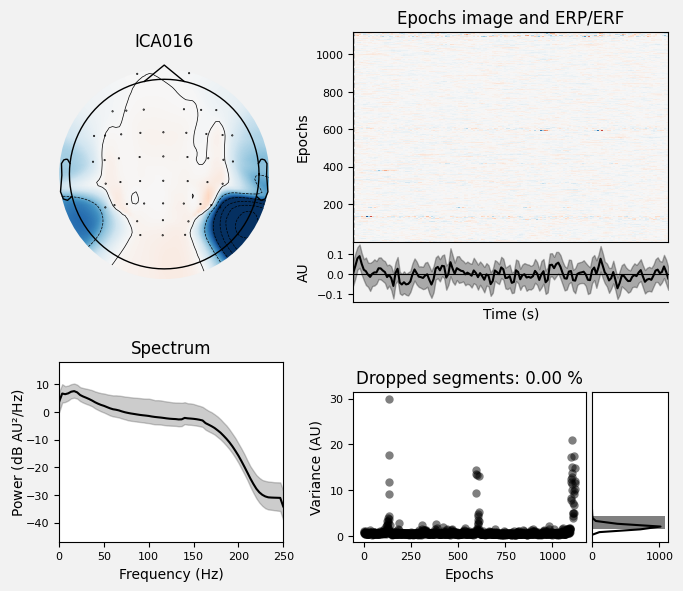

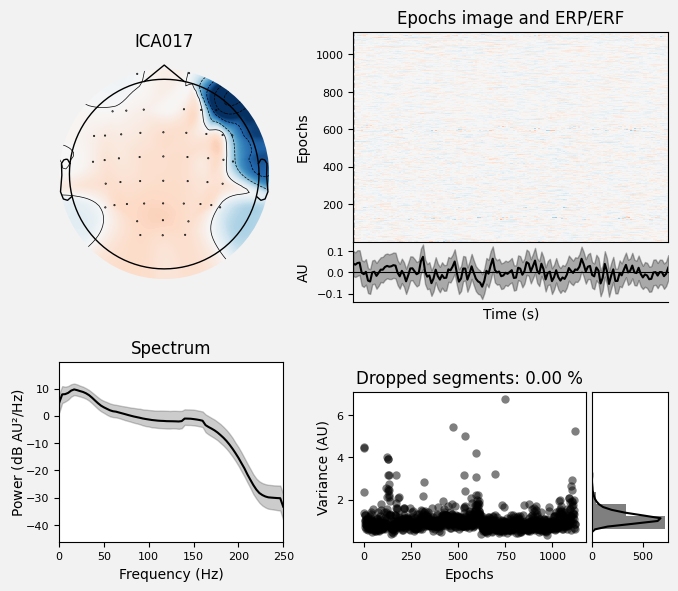

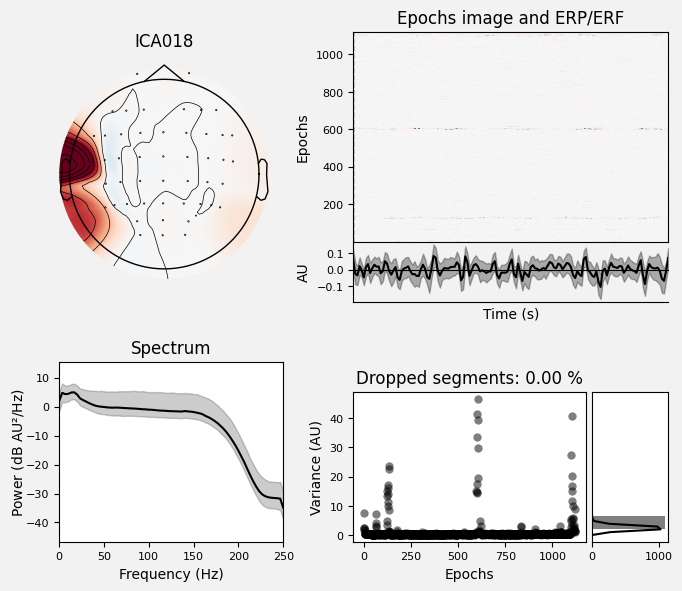

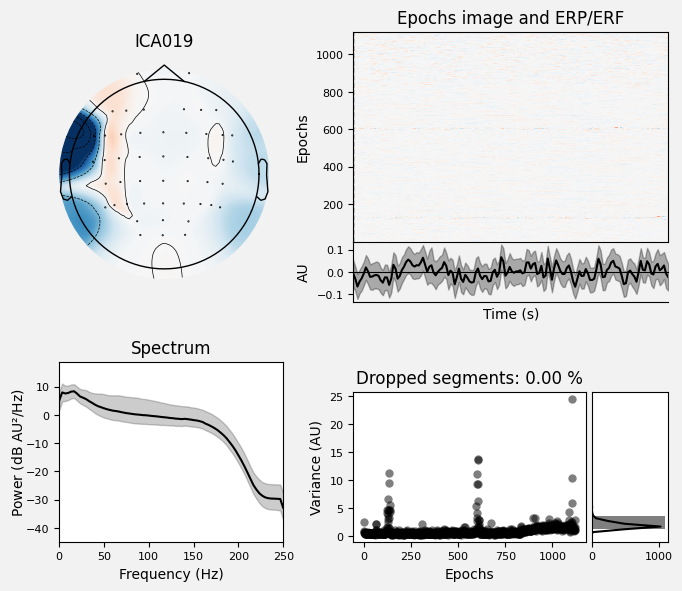

[<Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>,
 <Figure size 700x600 with 6 Axes>]

In [356]:
ica.exclude = muscle_idx_auto
ica.plot_properties(epochs, picks=ica.exclude)

In [357]:
print(f"Automatically found muscle artifact ICA components: {muscle_idx_auto}")

Automatically found muscle artifact ICA components: [12, 13, 14, 16, 17, 18, 19]


In [358]:
orig_raw = epochs.copy()
epochs.load_data()
ica.apply(epochs)

Using data from preloaded Raw for 1121 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 48 PCA components


<Epochs | 1121 events (all good), 0 – 0.298 s (baseline off), ~61.6 MiB, data loaded,
 '1': 1121>

In [8]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


def get_features(epochs):
    # Исключаем ушные электроды
    epochs.pick_channels([ch for ch in epochs.ch_names if ch not in ['A1', 'A2']])

    # Частотные диапазоны
    freq_bands = {
        'delta': (0.9, 4),
        'theta': (4, 8),
        'alpha': (8, 14),
        'beta': (14, 25),
        'gamma': (25, 40)
    }

    # Определяем ROI (пример для pre-frontal)
    roi_channels = {
        'prefrontal': ['Fp1', 'Fp2'],
        'left_frontal': ['F3', 'FC3', 'FT7'],
        'midline_frontal': ['FCz'],
        'right_frontal': ['F4', 'FC4', 'FT8'],
        'left_central': ['C3', 'CP3'],
        'midline_central': ['Cz', 'CPz'],
        'right_central': ['C4', 'CP4'],
        'left_parietal': ['P3', 'P5'],
        'midline_parietal': ['Pz'],
        'right_parietal': ['P4', 'P6'],
        'left_occipital': ['PO3', 'O1'],
        'midline_occipital': ['POz', 'Oz'],
        'right_occipital': ['PO4', 'O2']
    }
    # Вычисляем PSD для каждой эпохи и каждого канала
    psds = []
    freqs = None
    for epoch in epochs.get_data():
        psd, freqs = mne.time_frequency.psd_array_multitaper(epoch, sfreq=epochs.info['sfreq'],
                                                            fmin=0.9, fmax=40, adaptive=True, normalization='full')
        psds.append(psd)  # psd shape: (n_channels, n_freqs)

    psds = np.array(psds)  # shape: (n_epochs, n_channels, n_freqs)

    # Усреднение PSD по частотным диапазонам
    def band_power(psd, freqs, fmin, fmax):
        idx = np.logical_and(freqs >= fmin, freqs <= fmax)
        return psd[:, idx].mean(axis=1)

    band_powers = {band: np.array([band_power(epoch_psd, freqs, fmin, fmax) for epoch_psd in psds])
                for band, (fmin, fmax) in freq_bands.items()}  # shape: (n_epochs, n_channels)

    # Усреднение по ROI
    roi_band_powers = {}
    for band, data in band_powers.items():
        roi_band_powers[band] = []
        for roi, ch_names in roi_channels.items():
            ch_indices = [epochs.ch_names.index(ch) for ch in ch_names if ch in epochs.ch_names]
            roi_mean = data[:, ch_indices].mean(axis=1)
            roi_band_powers[band].append(roi_mean)
        roi_band_powers[band] = np.array(roi_band_powers[band]).T  # shape: (n_epochs, n_rois)


    # Логарифмирование и стандартизация
    for band in roi_band_powers:
        roi_band_powers[band] = np.log(roi_band_powers[band] + 1e-10)  # добавляем epsilon для стабильности

    # Объединяем все признаки в один массив
    features = np.hstack([roi_band_powers[band] for band in freq_bands])

    # Стандартизация
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)

    # PCA
    pca = PCA(n_components=15)
    features_pca = pca.fit_transform(features_scaled)

    return features_pca


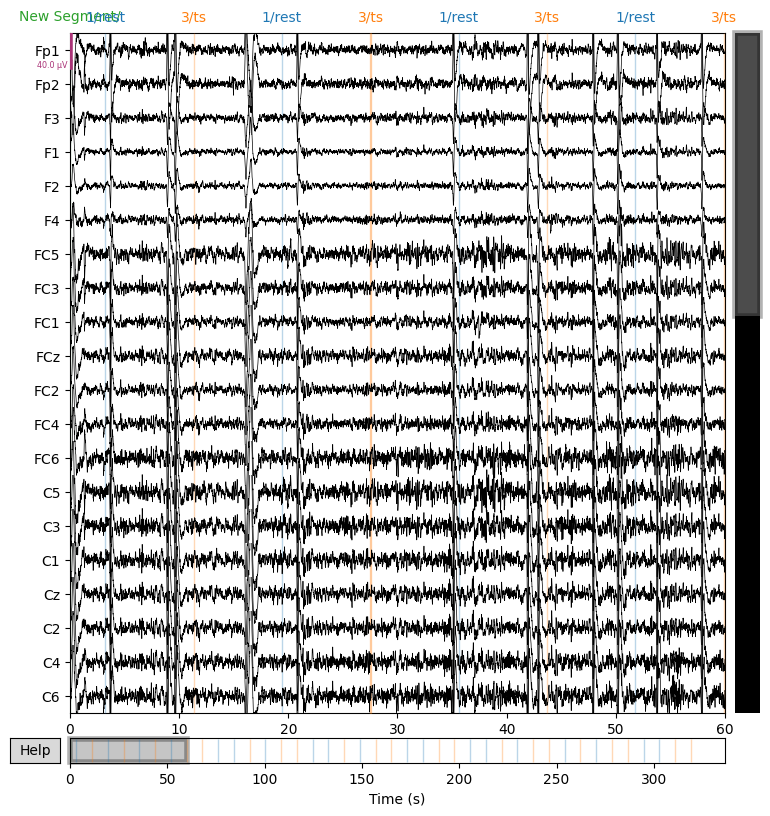

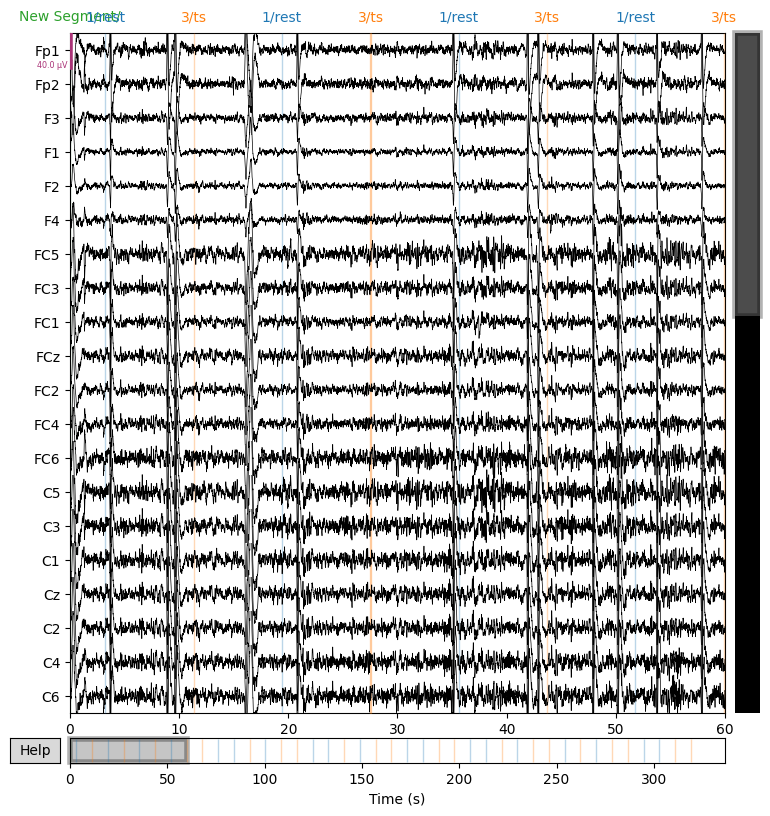

In [373]:
raw_part1.plot(duration=60, start=0)

In [10]:
raw_part1 = raw.copy().crop(tmin=0, tmax=60)
raw_part1, epochs_part1 = process_raw(raw_part1)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 9.7s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 48 PCA components


In [11]:
features_pca_part1 = get_features(epochs_part1)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    U

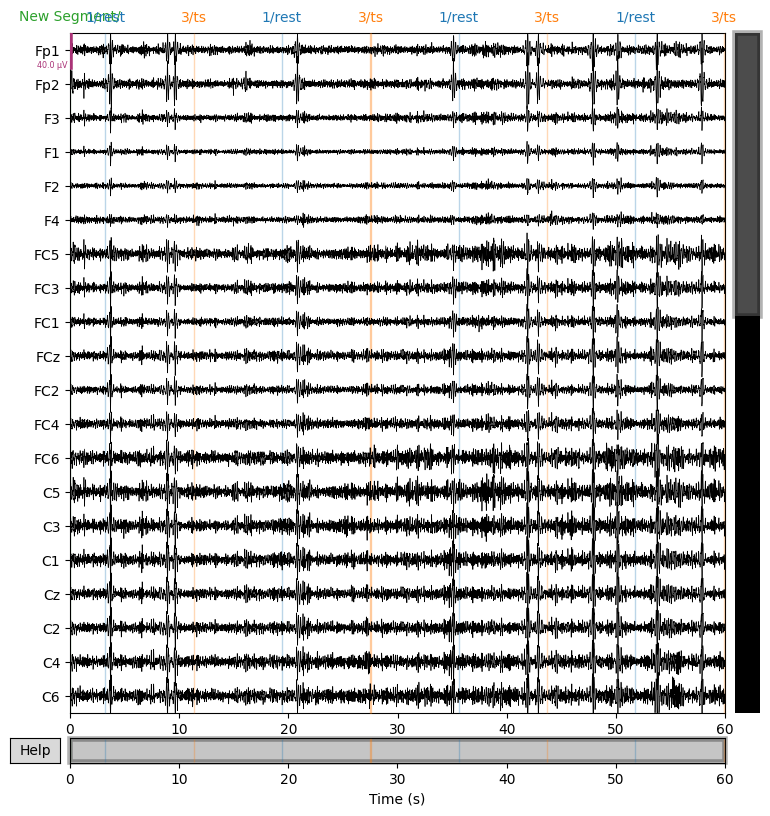

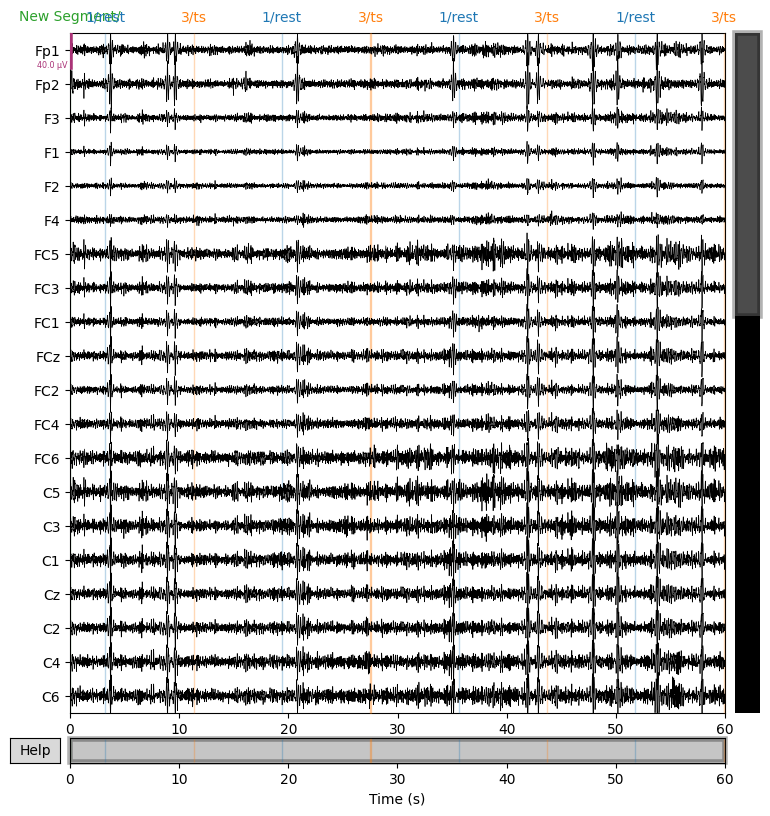

In [37]:
raw_part1.plot(duration=60, start=0)

In [341]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
from SDA import SDA

sda = SDA(n_clusters=[8], n_clusters_min=8, n_clusters_max=9, verbose=True)
result, df_st_edges = sda.apply(features_pca_part1)


Applying to 200 samples with 15 features each


stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (13). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (15). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args

In [381]:
result

,St_len_min,K_nb_max,N_cl_max,Cl_cen,Len_min,St_edges,N_stages,Longest_stage,Shortest_stage,Avg_stage_length,Ward_dist,Cen_dist,Silh,Cal-Har,Dav-Bold,Avg-Silh,Avg-Cal-Har,Avg-Dav-Bold
0,0,35,10,Median,40,"[0, 140, 200]",2,140,60,100.000000,221.076242,2.294280,0.066602,3.458604,4.972355,0.066602,3.458604,4.972355
1,0,35,10,Mode,40,"[0, 116, 200]",2,116,84,100.000000,472.790987,3.115164,0.082293,7.546620,3.581671,0.082293,7.546620,3.581671
2,0,35,10,Median,40,"[0, 128, 200]",2,128,72,100.000000,381.333225,2.876710,0.091956,6.042236,3.985454,0.091956,6.042236,3.985454
3,0,35,10,Mode,40,"[0, 116, 200]",2,116,84,100.000000,472.790987,3.115164,0.082293,7.546620,3.581671,0.082293,7.546620,3.581671
4,0,35,10,Median,40,"[0, 69, 128, 200]",3,72,59,66.666667,143.098642,1.917374,-0.072610,3.293113,7.070182,0.003490,2.209439,6.325497
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1339,60,50,20,Mode,40,"[0, 69, 139, 200]",3,70,61,66.666667,200.701909,2.311930,-0.055653,3.929441,5.527097,0.022305,3.218144,5.082661
1340,60,50,20,Median,40,"[0, 69, 139, 200]",3,70,61,66.666667,200.701909,2.311930,-0.055653,3.929441,5.527097,0.022305,3.218144,5.082661
1341,60,50,20,Mode,40,"[0, 69, 139, 200]",3,70,61,66.666667,200.701909,2.311930,-0.055653,3.929441,5.527097,0.022305,3.218144,5.082661
1342,60,50,20,Median,40,"[0, 69, 139, 200]",3,70,61,66.666667,200.701909,2.311930,-0.055653,3.929441,5.527097,0.022305,3.218144,5.082661


In [382]:
df_st_edges

,N_clusters,K_neighb,Len_min,St_edges,Silh,Cal-Har,Dav-Bold
0,8,20,0,"[0, 33, 69, 70, 116, 118, 139, 140, 192, 194, ...",0.158517,87.013720,1.854914
1,8,20,20,"[0, 33, 116, 139, 161, 200]",0.158517,87.013720,1.854914
2,8,20,40,"[0, 69, 139, 200]",0.158517,87.013720,1.854914
3,8,20,60,"[0, 69, 139, 200]",0.158517,87.013720,1.854914
4,8,21,0,"[0, 33, 69, 70, 116, 118, 139, 140, 192, 194, ...",0.157220,87.234007,1.848755
...,...,...,...,...,...,...,...
119,8,49,60,"[0, 116, 200]",0.133336,111.683210,1.400257
120,8,50,0,"[0, 12, 13, 139, 144, 200]",0.126576,111.802425,1.383039
121,8,50,20,"[0, 70, 116, 139, 200]",0.126576,111.802425,1.383039
122,8,50,40,"[0, 116, 200]",0.126576,111.802425,1.383039


In [386]:
# Основные импорты
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import mne
from SDA import SDA
from SDA.analytics.best_result import best_result
from SDA.analytics.best_results import best_results
from SDA.analytics.plot_eeg_stages import plot_eeg_stages
from SDA.analytics.draw_sources_heatmap import draw_sources_heatmap
from SDA.analytics.edge_statistics import edge_statistics

# 1. Использование best_result и best_results (best_result.py, best_results.py)
def use_best_functions(results):
    best_single = best_result(results, key='Silh', n_stages=2)
    best_all = best_results(results, key='Silh')
    return best_single, best_all

# 2. Визуализация EEG этапов (plot_eeg_stages.py)
def use_plot_eeg(raw, edges, epochs):
    fig = plot_eeg_stages(raw, edges, epochs)
    fig.suptitle('Визуализация этапов EEG')
    return fig

# 3. Тепловая карта источников (draw_sources_heatmap.py)
def use_heatmap(scores):
    svg_code = draw_sources_heatmap(scores)
    with open('heatmap.svg', 'w') as f:
        f.write(svg_code)

# 4. Статистика этапов (plot_stats.py)
def use_plot_stats(features, epochs, result, df_st_edges):
    fig = plot_stats(features, epochs, result, df_st_edges)
    plt.title('Статистика этапов кластеризации')
    return fig

# 5. Анализ границ (edge_statistics.py)
def use_edge_stats(features, edges):
    stats = edge_statistics(features, edges)
    # stats.plot(title='Метрики качества границ этапов')
    print(stats)
    return stats

# 6. Визуализация призфнаков (plot_features.py)
def use_plot_features(features, edges):
    fig = plot_features(features, edges)
    plt.suptitle('Распределение признаков по этапам')
    return fig


def show_stats(features, result, df_st_edges, epochs):
    best_single, best_all = use_best_functions(result)
    fig1 = use_plot_eeg(raw_part1, best_single['St_edges'], epochs)
    use_heatmap([0.8, 0.6, 0.9, 0.7])
    fig2 = use_plot_stats(features, epochs, best_single, df_st_edges)
    stats = use_edge_stats(features, best_single['St_edges'])
    fig3 = use_plot_features(pd.DataFrame(features), best_single['St_edges'])

    plt.show()  

    return best_single, best_all


{'Silh': 0    0.104006
Name: Silh, dtype: float64, 'Cal-Har': 0    6.691148
Name: Cal-Har, dtype: float64, 'Dav-Bold': 0    3.760567
Name: Dav-Bold, dtype: float64, 'Ward': array([420.9481422]), 'Centr': array([3.15106222])}


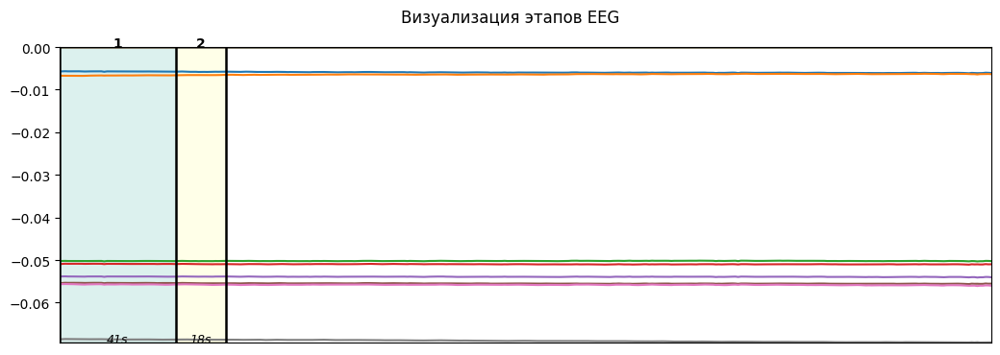

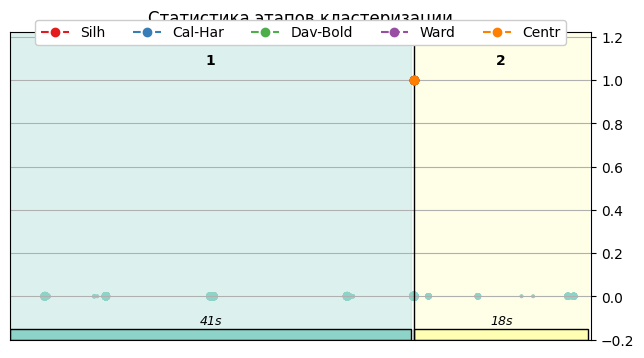

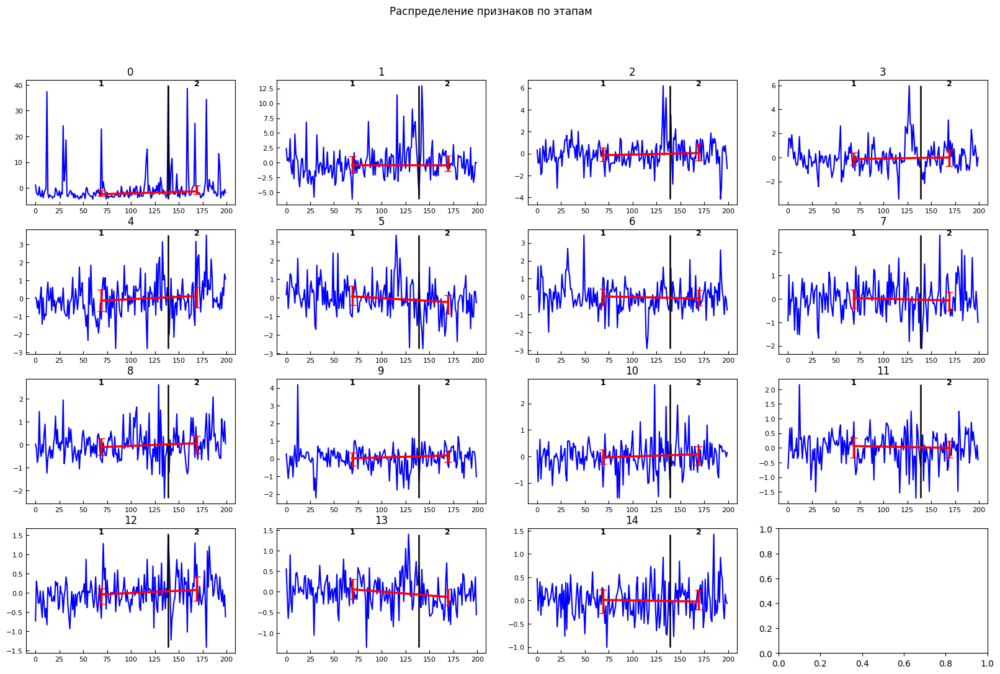

In [387]:
best_single, best_all = show_stats(features_pca_part1, result, df_st_edges, epochs_part1)

N_clusters                         8
K_neighb                          32
Len_min                           20
St_edges      [0, 33, 115, 139, 200]
Silh                        0.207679
Cal-Har                    91.596156
Dav-Bold                       1.245
Name: 49, dtype: object
<Annotations | 9 segments: 1/rest (4), 3/ts (4), New Segment/ (1)>
[ 0.   9.9 34.5 41.7 60. ]
<Annotations | 14 segments: 1/rest (4), 3/ts (4), New Segment/ (1), X (5)>


/var/folders/j5/w7wcgztd3yx3t5qry7kcv9480000gn/T/ipykernel_13348/1475132225.py:28: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_.set_annotations(before + border_annot)


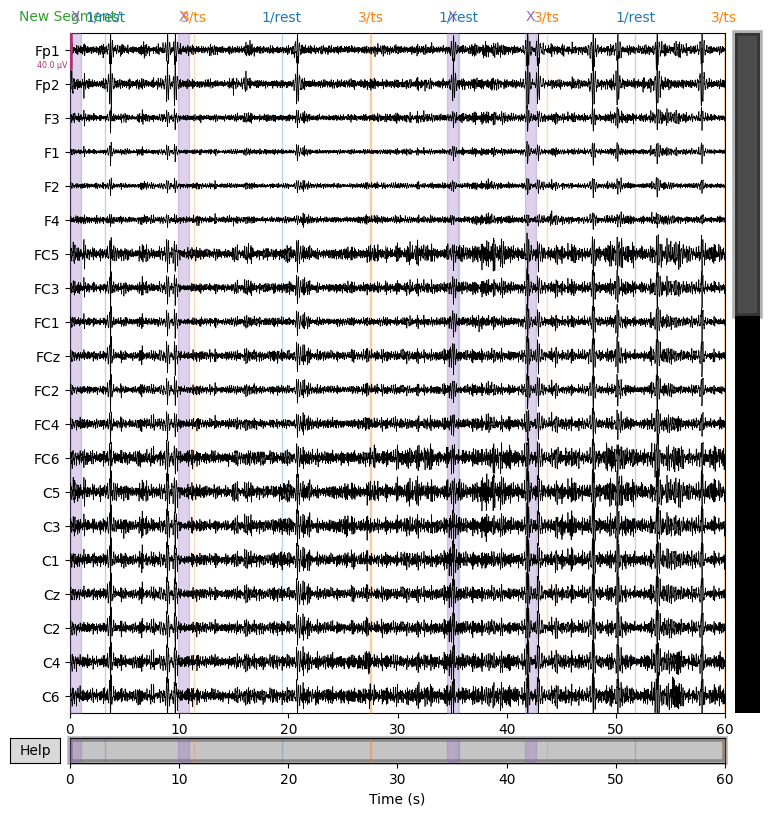

<RawBrainVision | NeoRec_2021-05-17_14-27-54.eeg, 48 x 30001 (60.0 s), ~11.0 MiB, data loaded>

In [35]:
def show_result(raw, df_st_edges):
    raw_ = raw.copy()
    df_match = df_st_edges.copy()

    # Выбираем лучший результат (например, с максимальным Silh)
    best_row = df_match.sort_values('Silh', ascending=False).iloc[0]
    best_edges = np.array(best_row['St_edges'])  # массив индексов эпох
    print(best_row)

    # Переводим индексы эпох в секунды с учётом сдвига начала raw
    epoch_length = 0.3
    t0 = raw_.times[0]  # или raw_.first_time
    onsets_sec = best_edges * epoch_length + t0
    durations_sec = np.full_like(onsets_sec, 1, dtype=float)  # короткие полоски
    descriptions = ['X'] * len(onsets_sec)

    before = raw_.annotations.copy()
    print(before)
    print(onsets_sec)

    # Создаём аннотации
    border_annot = mne.Annotations(onset=onsets_sec, duration=durations_sec, description=descriptions)

    # Добавляем к существующим аннотациям
    raw_.set_annotations(before + border_annot)

    print(before + border_annot)

    # Визуализируем
    raw_.plot(duration=60, start=0)

    return raw_


show_result(raw_part1, df_st_edges)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 15.1s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (13). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
stage 2:   0%|          | 1/672 [00:00<01:15,  8.89it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (15). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to dup

[  0  33 115 139 200]
<Annotations | 9 segments: 1/rest (4), 3/ts (4), New Segment/ (1)>
[ 0.   9.9 34.5 41.7 60. ]
<Annotations | 14 segments: 1/rest (4), 3/ts (4), New Segment/ (1), X (5)>


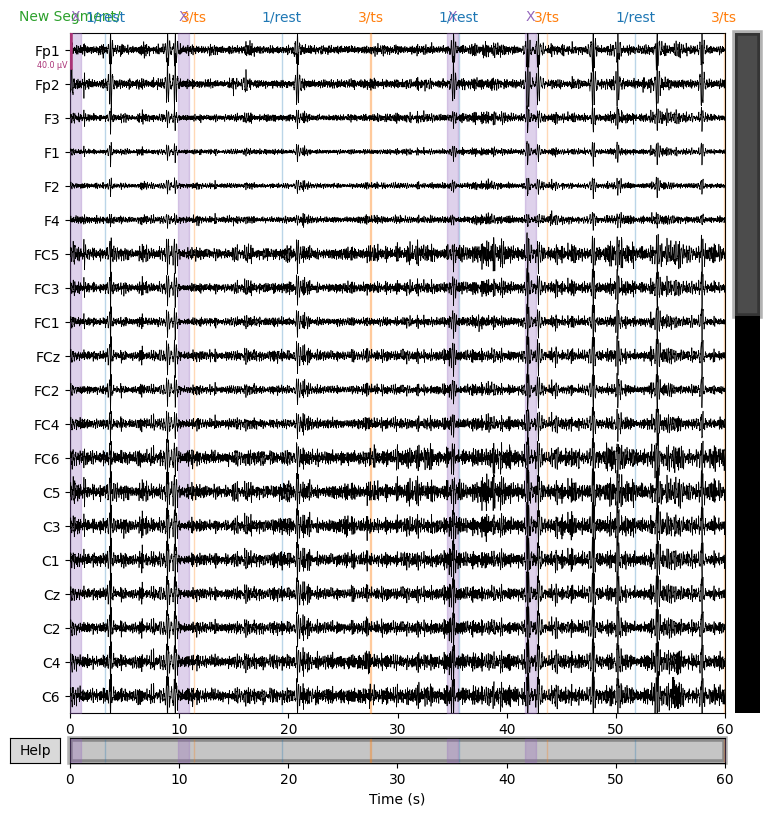

In [33]:
raw_part = raw.copy().crop(tmin=0, tmax=60)
raw_part_, epochs_part = process_raw(raw_part)
features_pca_part = get_features(epochs_part)

n_clusters = len(raw_part.annotations) - 1
print(n_clusters)

sda_part = SDA(n_clusters=[n_clusters], n_clusters_min=n_clusters, n_clusters_max=n_clusters+1)
result_part, df_st_edges_part = sda_part.apply(features_pca_part)

raw_ = show_result(raw_part, df_st_edges_part)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 10.0s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with

stage 2:  16%|█▌        | 109/672 [00:00<00:02, 238.51it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (3). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (2) found smaller than n_clusters (6). Possibly due to duplicate points in X.
  return fit_method(estimator, *a

[  0  33 116 139 161 200]


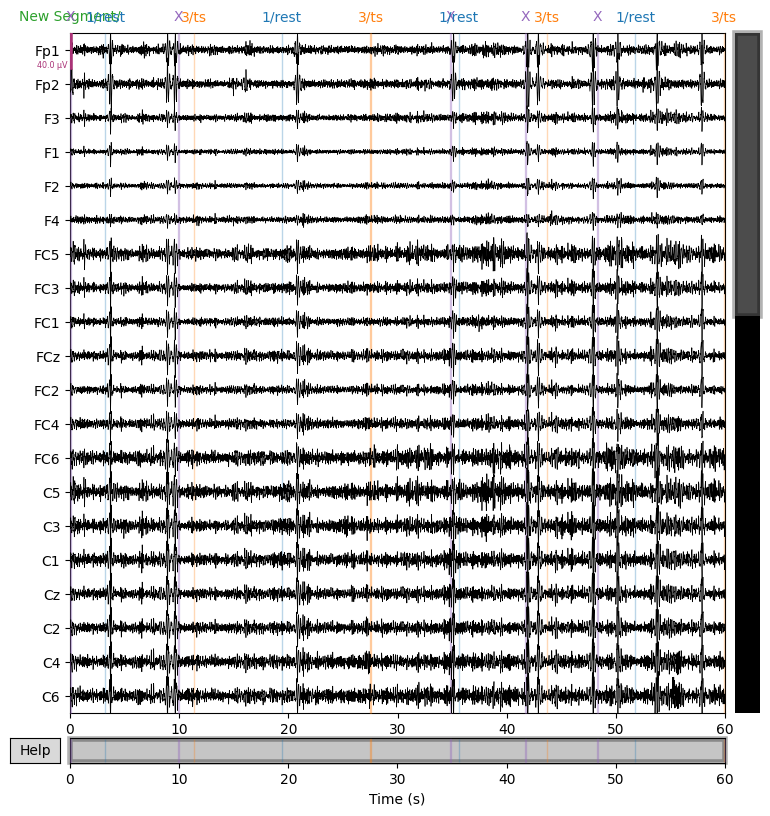

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 17.3s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 5 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitape

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (13). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (15). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (12) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args

[  0  50  74 135 156 200]


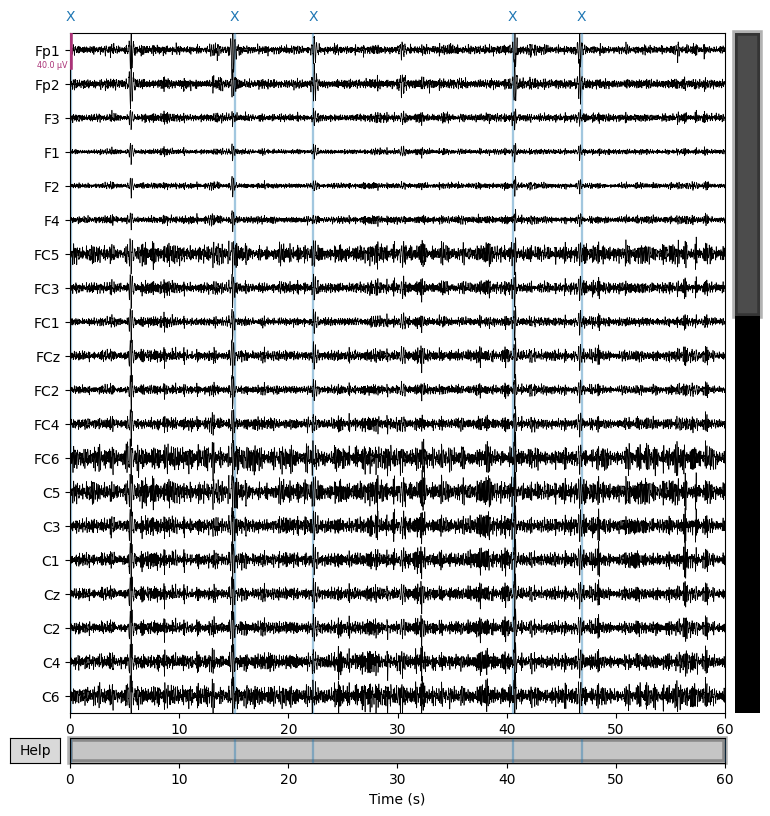

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 11.8s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 5 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitape

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (14). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kw

[  0  94  95 134 135 136 197 200]


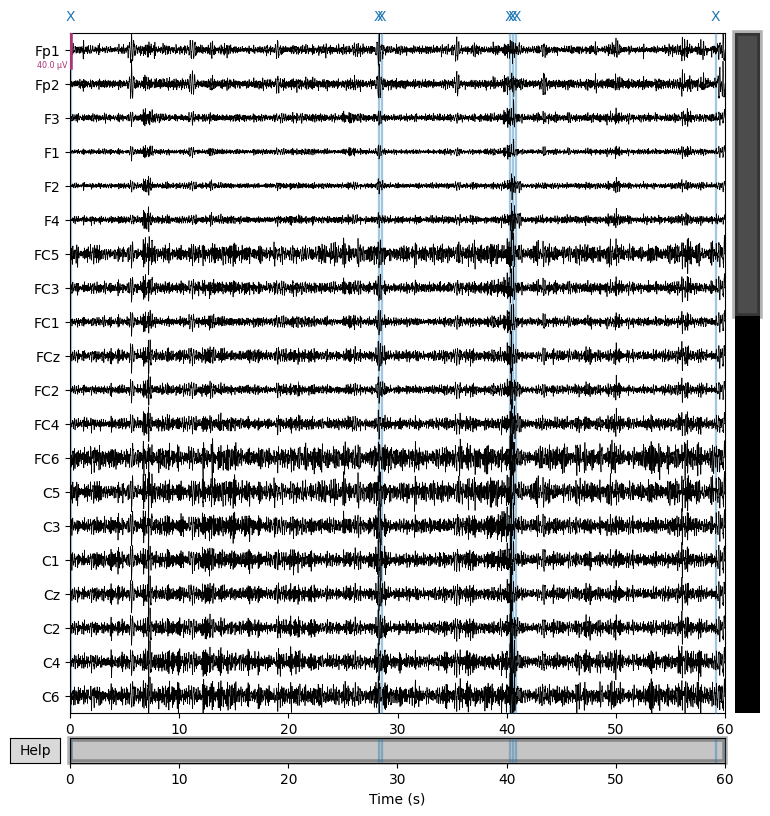

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 14.6s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 7 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitape

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (12). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kw

[  0 134 200]


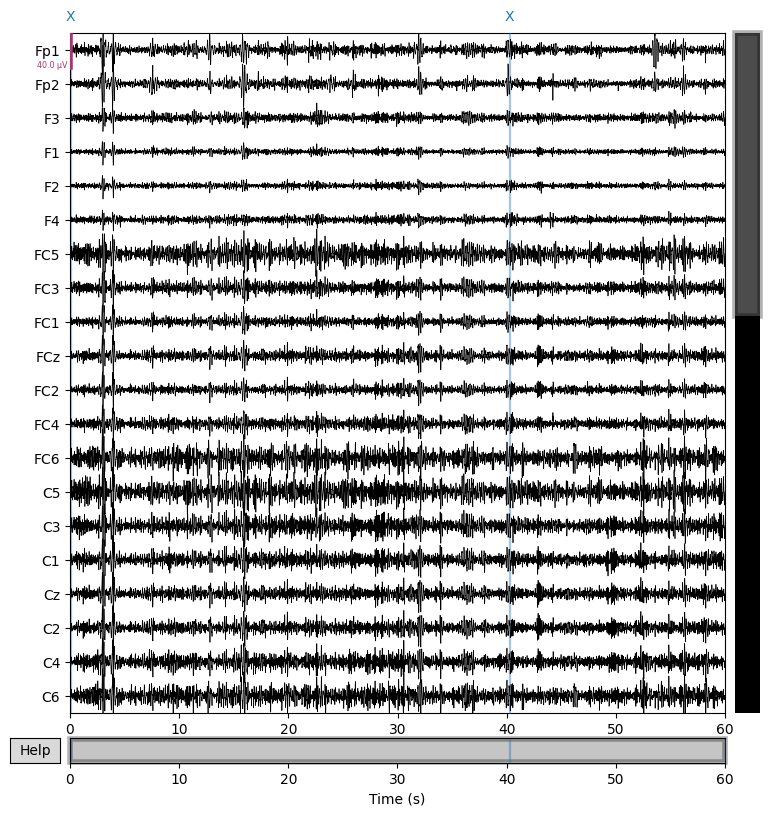

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


0 bad epochs dropped
Selecting by number: 20 components
Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 15.2s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spe

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (11). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (12). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kw

[  0  12  27 135 136 187 188 200]


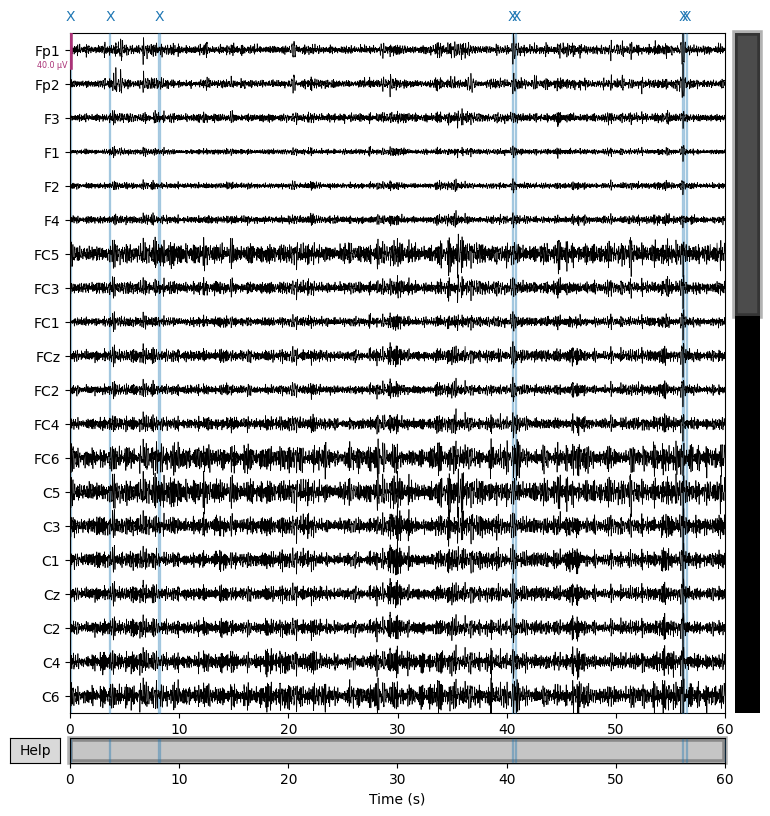

ValueError: tmax (360) must be less than or equal to the max time (336.5100 s)

In [464]:
raws = []

for i in range(0, int(raw.n_times / raw.info['sfreq']), 60):
    raw_part = raw.copy().crop(tmin=i, tmax=min(raw.n_times / raw.info['sfreq'], i+60))
    n_clusters = len(raw_part.annotations) - 1
    if n_clusters > 0:
        raw_part, epochs_part = process_raw(raw_part)
        features_pca_part = get_features(epochs_part)
        sda = SDA(n_clusters=[n_clusters], n_clusters_min=n_clusters, n_clusters_max=n_clusters+1)
        result, df_st_edges = sda.apply(features_pca_part)

        raw_ = show_result(raw_part, n_clusters, epochs_part, df_st_edges)

        raws.append(raw_)
    

### Tactile stimulation 

In [31]:
vhdr_file = 'N=20/subj01/tactile stimulation/NeoRec_2021-05-17_13-22-35.vhdr'

# Загрузка данных
raw3 = mne.io.read_raw_brainvision(vhdr_file, preload=True)

Extracting parameters from N=20/subj01/tactile stimulation/NeoRec_2021-05-17_13-22-35.vhdr...
Setting channel info structure...
Reading 0 ... 150374  =      0.000 ...   300.748 secs...


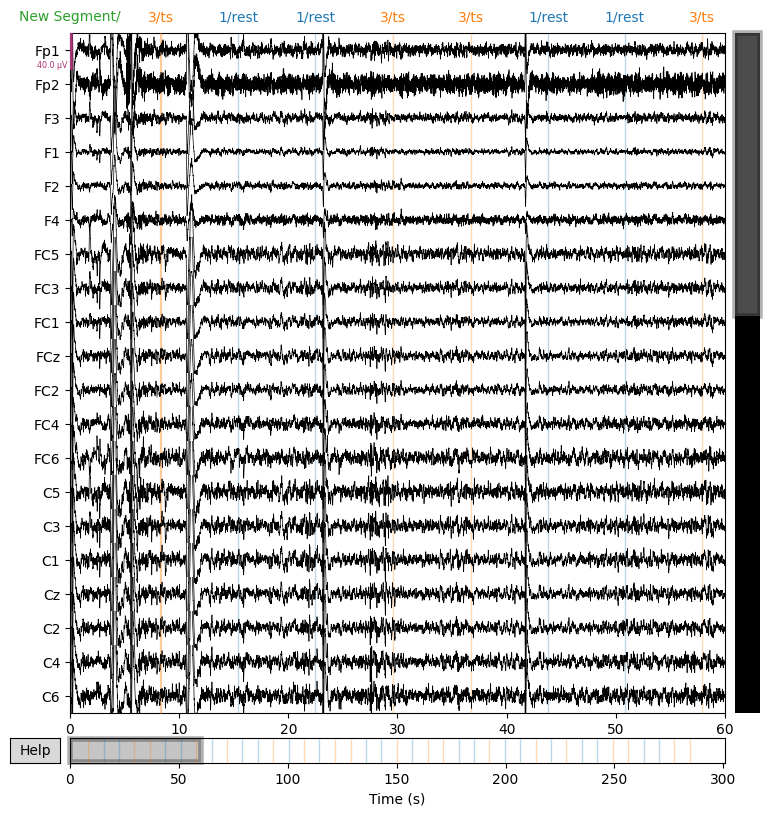

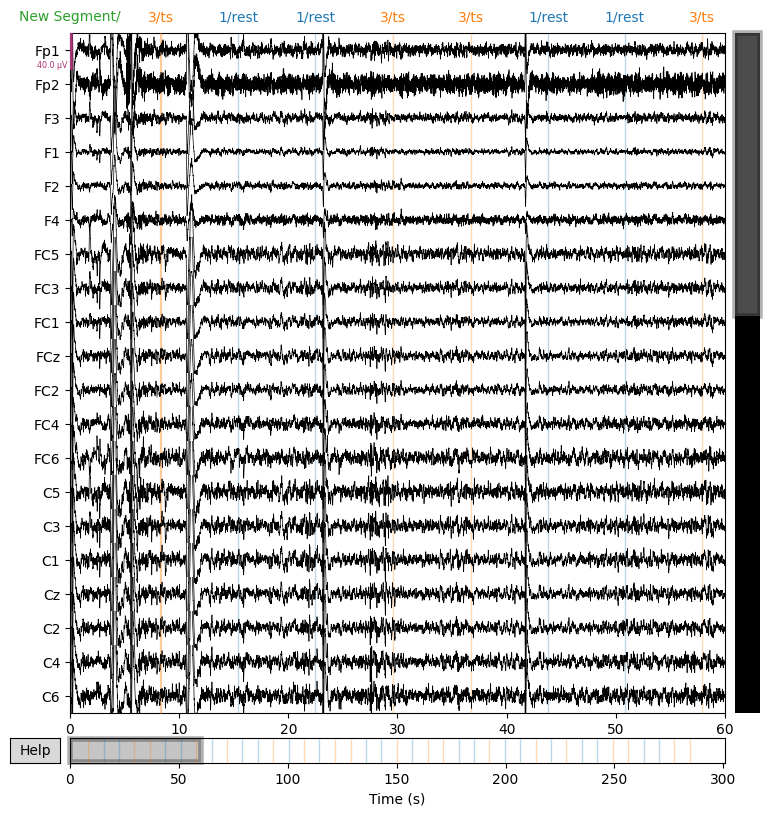

In [34]:
raw3.plot(duration=60, start=0)

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 5 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 5.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 4.00 Hz)
- Filter length: 825 samples (1.650 s)

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Using data from preloaded Raw for 200 events and 150 original time points ...
Fitting ICA took 12.8s.
Using data from preloaded Raw for 200 events and 150 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows
Using data from preloaded Raw for 200 events and 150 original time points ...
Applying ICA to Epochs instance
    Transforming to ICA space (20 components)
    Zeroing out 8 ICA components
    Projecting back using 48 PCA components
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with 7 DPSS windows
    Using multitaper spectrum estimation with

stage 2:   0%|          | 0/672 [00:00<?, ?it/s]/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (9). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (8). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (10). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/opt/homebrew/lib/python3.11/site-packages/sklearn/base.py:1474: ConvergenceWarning: Number of distinct clusters (7) found smaller than n_clusters (11). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kw

[  0  77 200]
<Annotations | 9 segments: 1/rest (4), 3/ts (4), New Segment/ (1)>
[ 0.  23.1 60. ]
<Annotations | 12 segments: 1/rest (4), 3/ts (4), New Segment/ (1), X (3)>


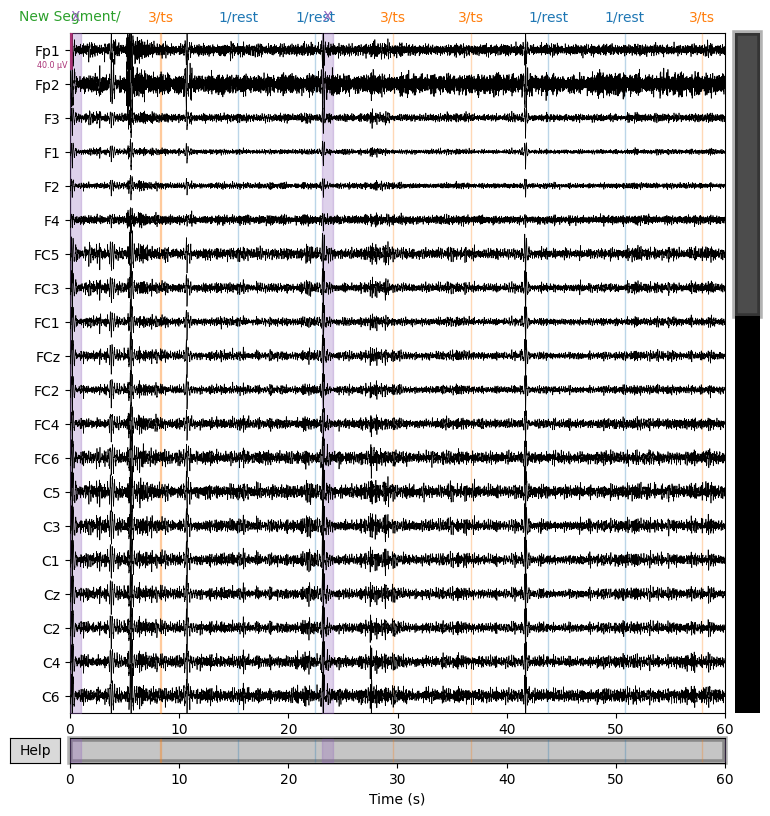

In [32]:
raw_part3 = raw3.copy().crop(tmin=0, tmax=60)
raw_part3, epochs_part3 = process_raw(raw_part3)
features_pca_part3 = get_features(epochs_part3)

n_clusters = len(raw_part3.annotations) - 1
print(n_clusters)

sda_part3 = SDA(n_clusters=[n_clusters], n_clusters_min=n_clusters, n_clusters_max=n_clusters+1)
result_part3, df_st_edges_part3 = sda_part3.apply(features_pca_part3)

raw_3 = show_result(raw_part3, df_st_edges_part3)

N_clusters               8
K_neighb                50
Len_min                 60
St_edges      [0, 77, 200]
Silh              0.574239
Cal-Har         281.771717
Dav-Bold          0.425863
Name: 123, dtype: object
<Annotations | 9 segments: 1/rest (4), 3/ts (4), New Segment/ (1)>
[ 0.  23.1 60. ]
<Annotations | 12 segments: 1/rest (4), 3/ts (4), New Segment/ (1), X (3)>


/var/folders/j5/w7wcgztd3yx3t5qry7kcv9480000gn/T/ipykernel_13348/1475132225.py:28: RuntimeWarning: Limited 1 annotation(s) that were expanding outside the data range.
  raw_.set_annotations(before + border_annot)


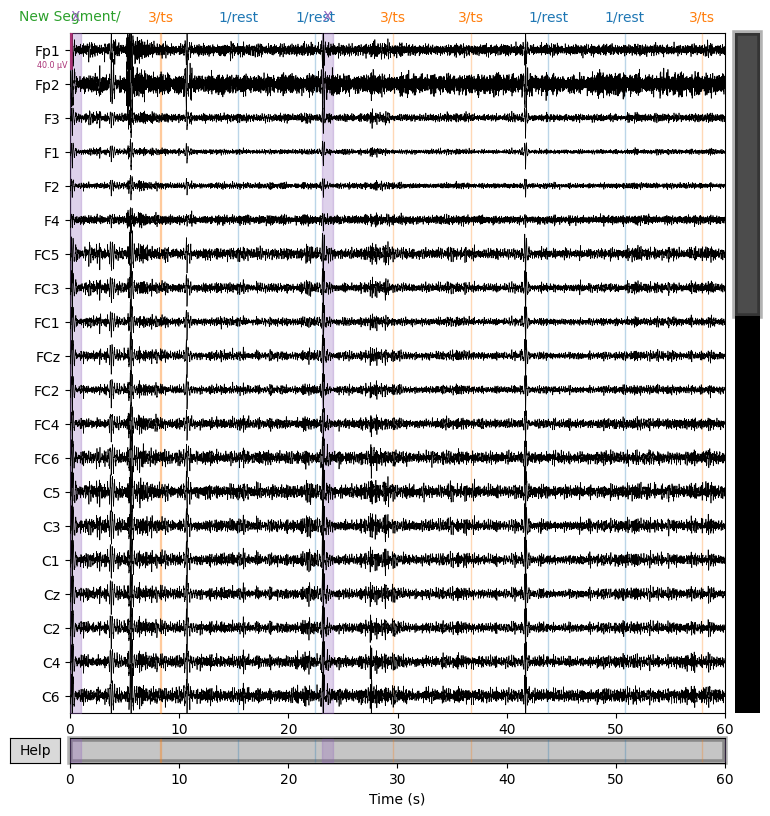

<RawBrainVision | NeoRec_2021-05-17_13-22-35.eeg, 48 x 30001 (60.0 s), ~11.0 MiB, data loaded>

In [36]:
show_result(raw_part3, df_st_edges_part3)